# Using a perceptron to classify caffeinated drinks

Machine Learning Fall 2022 
Mia (Bomi) Jung

In [3]:
import numpy as np

### An object-oriented perceptron API

In [4]:
# Changes to books code below marked #LS

class Perceptron:
    """Perceptron classifier.

    Parameters
    ------------
    eta : float
      Learning rate (between 0.0 and 1.0)
    n_iter : int
      Passes over the training dataset.
    random_state : int
      Random number generator seed for random weight
      initialization.

    Attributes
    -----------
    w_ : 1d-array
      Weights after fitting.
    b_ : Scalar
      Bias unit after fitting.
    errors_ : list
      Number of misclassifications (updates) in each epoch.

    """
    def __init__(self, eta=0.01, n_iter=50, random_state=1):
        self.eta = eta
        self.n_iter = n_iter
        self.random_state = random_state

    def fit(self, X, y):
        """Fit training data.

        Parameters
        ----------
        X : {array-like}, shape = [n_examples, n_features]
          Training vectors, where n_examples is the number of examples and
          n_features is the number of features.
        y : array-like, shape = [n_examples]
          Target values.

        Returns
        -------
        self : object

        """
        rgen = np.random.RandomState(self.random_state)
        self.w_ = rgen.normal(loc=0.0, scale=0.01, size=X.shape[1])
        self.b_ = np.float_(0.)
        #self.b_ = 0. # same! #LS
        
        self.errors_ = []

        for _ in range(self.n_iter):
            errors = 0
            for xi, target in zip(X, y):
                # print("xi: ", xi, "Target: ", target, "Prediction: ", self.predict(xi)) #LS
                update = self.eta * (target - self.predict(xi))
                self.w_ += update * xi
                self.b_ += update
                errors += int(update != 0.0)
            self.errors_.append(errors)
            # print("Errors: ", errors) #LS
            # print(self.w_)
        return self

    def net_input(self, X):
        """Calculate net input"""
        return np.dot(X, self.w_) + self.b_

    def predict(self, X):
        """Return class label after unit step"""
        return np.where(self.net_input(X) >= 0.0, 1, 0)

### Reading-in the Caffeine data

In [5]:
# This gives us access to the library that will read a csv file:
# This is one way to read a data file.
import csv 
# put your data file whereever your notebook file is!

In [6]:
import os
import pandas as pd

try:
    df = pd.read_csv('caffeine.csv')
    
except HTTPError:
    s = 'caffeine.csv'
    print('From local path:', s)
    df = pd.read_csv(s,
                     header=None,
                     encoding='utf-8')
    
df.tail()
# with open('caffeine.csv') as f:
#     data = [row for row in csv.reader(f)]
# print(data)

,drink,Volume (ml),Calories,Caffeine (mg),type,Calories (per ml),Caffeine (mg/ml)
605,Pep Talk Sparkling Water,354.882,0,55,Water,0.000000,0.154981
606,Polar Seltzer Water,354.882,0,0,Water,0.000000,0.000000
607,Yerbae Sparkling Water,354.882,0,100,Water,0.000000,0.281784
608,Tonic Water,295.735,110,0,Water,0.371955,NaN
609,MiO Energy Water Enhancer,236.588,0,60,Water,0.000000,NaN


### Plotting the Caffeine data

['Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee'
 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coffee' 'Coff

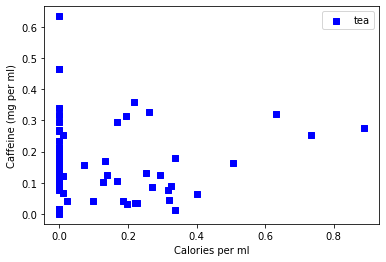

In [26]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

# select coffee and tea
y = df.iloc[0:239,4].values

print(y)
y = np.where(y == 'Coffee', 0, 1)
print(y)

# extract sepal length and petal length
X = df.iloc[0:239, [5, 6]].values

# # plot data scatter (coffeeCaloriesPerMl, coffeeCaffeinePerML)
# plt.scatter(X[:173, 0], X[:173, 1],
#             color='red', marker='o', label='coffee')

# plot data scatter (teaCaloriesPerMl, teaCaffeineMgPerMl)
plt.scatter(X[174:239, 0], X[174:239, 1],
            color='blue', marker='s', label='tea')

plt.xlabel('Calories per ml')
plt.ylabel('Caffeine (mg per ml)')
plt.legend(loc='upper right')

# plt.savefig('images/02_06.png', dpi=300)
plt.show()

### Training the perceptron model

xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  0
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  0
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772  

xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.4015

xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185

xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0

xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.  

xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.010566

xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.202884

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.715772   0.07404538] Target:  0 Prediction:  1
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.010566

xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63

xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  1
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0

xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  1
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.  

xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.202884

xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] T

xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.0253

xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55

xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0

xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.0211

xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.0100

xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04

xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893]

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04

xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.14

xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3

xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349

xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01

Errors:  7
[-0.01647055 -0.04114367]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Targe

xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644

xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001]

xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] T

xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21

xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47

xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001]

xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3

xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] T

xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.1690

xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0

xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33

xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893]

xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719

xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0

xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.8876

xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.51

xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] T

xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0

xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  0
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185

xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.4226

xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  0
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] T

xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0

xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.4015

xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.0084

xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893]

xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0

xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.51

xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.619924

xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.51

xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45

xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.  

xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.2254

xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.1268

xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] T

xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353

xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.15

xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  0
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.51

xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353

xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.3339

xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.2205

xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30

xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.0211

xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01035476 -0.04170619]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] T

xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.2113

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65

xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001]

xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03

xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.0211

xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.49

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] T

xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27

xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1

xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.0211

xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67

xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01575448 -0.041

xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15

xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  0
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.49

xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01

xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42

xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01640914 -0.04190214]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] T

xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.010566

xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65

xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01

xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] T

xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.0634

xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01257228 -0.04664596]
xi:  [0.         1.07784737] Target:  0 Predic

xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0

xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.5494

xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.        

xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.    

xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] T

xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.2113

xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25

xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.754104

xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12

xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82

xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27

xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349

xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27

xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.2254

xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.15

xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3

xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24

xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04

xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0

xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.    

xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.4226

xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.49

xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  0
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.0211

xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] T

xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.0634

xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01554194 -0.04599191]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Predic

xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01030621 -0.04181679]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Predic

xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.0100

xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.2617

xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0

xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.4170

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01376575 -0.04147377]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] T

xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21

xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353

xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.3339

xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] T

xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0

xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185

xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353

xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84

xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0

xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.5494

xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01086195 -0.04434479]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] T

xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01761702 -0.0418234 ]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Tar

xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.010566

xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] T

xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.00883831 -0.041712  ]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] T

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65

xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] T

xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27

xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] T

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.0084

xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        

xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3

xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028]

xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.0100

xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15

xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01553149 -0.04109761]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Tar

xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181

xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.3201

xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] T

xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01671201 -0.04128916]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Tar

xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01796843 -0.04109981]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] T

xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01034866 -0.04450321]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] T

xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893]

xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.1268

xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03

xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01104036 -0.0410086 ]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Tar

xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.1400

xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53

xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0

xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01341686 -0.04703487]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Tar

xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01

xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.315597

xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55

xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.010566

xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.2617

xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.1690

xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06

xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27

xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0

xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772  

xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.817877

xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] T

xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.0634

xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0

xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03

xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.619924

xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353

xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01022711 -0.04535428]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Tar

xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  1
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116

[-0.01300289 -0.04722384]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Predi

xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19

xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] T

xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.0211

xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] T

xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31

xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0

xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42

xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.0172221  -0.04670262]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] T

xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.2254

xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.0253

xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893]

xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01840261 -0.04689417]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] T

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65

xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.14

xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04

xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.51

xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0

xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.2113

xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.00727689 -0.04158564]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Tar

xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  1
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  0
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63

xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.0634

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] T

xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53

xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.  

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01311021 -0.04171464]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] T

xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42

xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33

xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772  

xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.  

xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65

xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] T

xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16

xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15

xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0

xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] T

xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772  

xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.2924

xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185

xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42

xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01570506 -0.04225362]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Predic

xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  1
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] T

xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0

xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.1268

xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] T

xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.619924

xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  1
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  0
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31

xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06

xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.49

xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0

xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028]

xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.1690

xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03

[-0.01389521 -0.04144972]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Predi

xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.49

xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] T

xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893]

xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57

xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] T

xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.  

Errors:  7
[-0.01693391 -0.04707709]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Targe

xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.8876

xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01507572 -0.04164127]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] T

xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16

xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03

xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01921293 -0.04654251]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Tar

xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.202884

xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16

xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] T

xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772  

xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.2924

xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01436894 -0.04306005]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] T

xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03

xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15

xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] T

xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.  

xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45

xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01138313 -0.0450134 ]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Tar

xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  1
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] T

xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.024152

xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3

xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181

xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.4226

xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01

xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.315597

xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.15

xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.      

xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        

xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25

xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15

xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        

xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.2617

xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        

xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.  

xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80

xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.0634

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01754254 -0.04692083]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Tar

xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.1334

xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] T

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.1334

xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.        

xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65

xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.4226

xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67

xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01547432 -0.04289264]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] T

xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  1
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116

xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.4015

xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15

xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] T

xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82

xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.0845

xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] T

xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.14

xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01424739 -0.04632641]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] T

xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01314887 -0.04705253]
xi:  [0.         1.07784737] Target:  0 Predic

xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.5494

xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.4226

xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] T

xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349

xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45

xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] T

xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.]

xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.1859

xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01

xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45

xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.3339

xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] T

xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33

xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78

xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116

xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.2617

xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.49

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] T

xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04

xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.010566

xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0

xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772  

xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01

xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0

xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03

xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893]

xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] T

xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.0112

xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.        

xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27

xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0

xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] T

xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27

xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] T

xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.2617

xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0

xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.2617

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39

xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0

xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04

xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.0211

xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.2254

xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.    

xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39

xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0

xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63

xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.0253

xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40

xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21

xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644

xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.1334

xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.0211

xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353

xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.0634

xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] T

xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.0112

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06

xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.0253

xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0

xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27

xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.010566

xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01868998 -0.04106677]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] T

xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.1268

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719

xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0

xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27

xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02

xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27

xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06

xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.817877

xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] T

xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12

xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55

xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116

xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.2924

xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21

xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] T

xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0

xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] T

xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185

xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01720051 -0.04670051]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Tar

xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.    

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] T

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30

xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.010566

xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12

xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.1268

xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.0634

xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27

xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.3381

xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.8876

xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.0191407  -0.04671387]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] T

xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50

xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0

xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893]

xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.0084

xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  6
[-0.01379996 -0.04565785]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] T

xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] T

xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  1
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  0
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01

xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  1
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  0
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.1859

xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03

xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028]

xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  1
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  0
xi:  [0.1334

xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24

xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.00997064 -0.04618097]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Tar

xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84

xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01570648 -0.04697016]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Predic

xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.0100

xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55

xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80

xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.51

xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01722583 -0.04661378]
xi:  [0.         1.07784737] Target:  0 Predic

xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] T

xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1

xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181

xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55

xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772  

xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04

xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1

xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.2617

xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03

xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.]

xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.    

xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] T

xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.024152

xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.    

xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21

xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.14

xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] T

xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25

xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50

xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29

xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116

xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04

xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52

xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758]

xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.22052646 0.03381406] Target:  1 Prediction:  1
xi:  [0.18597731 0.04226757] Target:  1 Prediction:  1
xi:  [0.33814057 0.01183492] Target:  1 Prediction:  1
xi:  [0.4015

xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0

xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01

xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] T

xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03

xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.        0.1775238] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.07608163] Target:  1 Prediction:  1
xi:  [0. 0.]

xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65514735 0.34870746] Target:  0 Prediction:  0
xi:  [0.52834463 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.4332426 ] Target:  0 Prediction:  0
xi:  [0.         0.05283446] Target:  0 Prediction:  1
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.40154192 0.31700678] Target:  0 Prediction:  0
xi:  [0.78195006 0.36984124] Target:  0 Prediction:  0
xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00

xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01505413 -0.04163916]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Tar

xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.4226

xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50

xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.0158138  -0.04146096]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] T

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0

xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185

xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25

xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.40154192 0.06340136] Target:  1 Prediction:  1
xi:  [0.         0.08030838] Target:  1 Prediction:  1
xi:  [0.25360542 0.13102947] Target:  1 Prediction:  1
xi:  [0.16907028 0.29587299] Target:  1 Prediction:  1
xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  0
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.         0.30643989] Target:  0 Prediction:  0
xi:  [0.03170068 0.39942854] Target:  0 Prediction:  0
xi:  [0.01056689 0.56427207] Target:  0 Prediction:  0
xi:  [0.02113378 0.29587299] Target:  0 Prediction:  0
xi:  [0.40154192 0.29587299] Target:  0 Prediction:  0
xi:  [0.82421763 0.34870746] Target:  0 Prediction:  0
xi:  [0.29587299 0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.31700678] Target:  0 Prediction:  0
xi:  [0.25360542 0.29587299] Target:  0 Prediction:  0
xi:  [0.65

xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  7
[-0.01908632 -0.04724422]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] T

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  0
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] Target:  0 Prediction:  0
xi:  [0.64172662 0.42205866] Target:  0 Prediction:  0
xi:  [0.74045379 0.27149972] Target:  0 Prediction:  0
xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67

xi:  [0.         0.63401356] Target:  1 Prediction:  1
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01010512 -0.04520064]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  1
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Target:  0 Prediction:  0
xi:  [0.33396599 0.55939303] Target:  0 Prediction:  0
xi:  [0.22376949 0.77076158] Target:  0 Prediction:  0
xi:  [0.72830275 0.62425951] Target:  0 Prediction:  0
xi:  [0.         0.62986968] Target:  0 Prediction:  0
xi:  [0.         1.58305508] Target:  0 Prediction:  0
xi:  [0.         0.24152898] Target:  0 Prediction:  0
xi:  [0.4079283  0.27995079] Target:  0 Prediction:  0
xi:  [0.85784922 0.31994376] Target:  0 Prediction:  0
xi:  [0.68987874 0.30994552] T

xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.         0.41422219] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.         0.29587299] Target:  0 Prediction:  0
xi:  [0.20288434 0.44380949] Target:  0 Prediction:  0
xi:  [0.0241529  0.19322318] Target:  0 Prediction:  0
xi:  [0.31559786 0.86789412] Target:  0 Prediction:  0
xi:  [0.         0.12962055] Target:  0 Prediction:  0
xi:  [0.61992437 0.55229626] Target:  0 Prediction:  0
xi:  [0.         1.26802712] Target:  0 Prediction:  0
xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.4170

xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30740051 0.30740051] Target:  0 Prediction:  0
xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15

xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0

xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  0
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.         0.38040814] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.15639001] Target:  1 Prediction:  1
xi:  [0.        0.1183492] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.10566893] Target:  1 Prediction:  1
xi:  [0.         0.12680271] Target:  1 Prediction:  1
xi:  [0.         0.26628569] Target:  1 Prediction:  1
xi:  [0.         0.16907028] Target:  1 Prediction:  1
xi:  [0.         0.33814057] Target:  1 Prediction:  1
xi:  [0.         0.63401356] Target:  1 Prediction:  0
xi:  [0.73263789 0.25360542] Target:  1 Prediction:  1
xi:  [0.50721085 0.16343461] Target:  1 Prediction:  1
Errors:  8
[-0.01811662 -0.0424899 ]
xi:  [0.         1.07784737] Target:  0 Prediction:  0
xi:  [0.         0.57955534] Target:  0 Prediction:  1
xi:  [0.59954001 0.39969334] Target:  0 Prediction:  0
xi:  [0.         1.71868136] Target:  0 Prediction:  0
xi:  [0.        0.2637976] Target:  0 Prediction:  1
xi:  [0.6843321  0.64407727] Tar

xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.2113

xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.33814057 0.32546029] Target:  0 Prediction:  0
xi:  [0.40154192 0.30009975] Target:  0 Prediction:  0
xi:  [0.80308384 0.35293421] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.06340136 1.26802712] Target:  0 Prediction:  0
xi:  [0.7185487  1.26802712] Target:  0 Prediction:  0
xi:  [0.00845351 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.02113378 0.53257139] Target:  0 Prediction:  0
xi:  [0.         0.84535141] Target:  0 Prediction:  0
xi:  [0.21133785 0.59174599] Target:  0 Prediction:  0
xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33

xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.  

xi:  [0.       0.357886] Target:  0 Prediction:  0
xi:  [0.715772   0.07404538] Target:  0 Prediction:  0
xi:  [0.02940353 0.52044243] Target:  0 Prediction:  0
xi:  [0.52926349 0.39106691] Target:  0 Prediction:  0
xi:  [0.47045644 0.35284233] Target:  0 Prediction:  0
xi:  [0.00966116 0.89848779] Target:  0 Prediction:  0
xi:  [0.         1.73578823] Target:  0 Prediction:  0
xi:  [0.        1.5779893] Target:  0 Prediction:  0
xi:  [0.         0.22542704] Target:  0 Prediction:  0
xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0

xi:  [0.31700678 0.07819501] Target:  1 Prediction:  1
xi:  [0.27051245 0.08664852] Target:  1 Prediction:  1
xi:  [0.63190018 0.31912016] Target:  1 Prediction:  1
xi:  [0.01056689 0.06762811] Target:  1 Prediction:  1
xi:  [0.01056689 0.25360542] Target:  1 Prediction:  1
xi:  [0.19322318 0.31398767] Target:  1 Prediction:  1
xi:  [0.19724866 0.03099622] Target:  1 Prediction:  1
xi:  [0.09862433 0.04226757] Target:  1 Prediction:  1
xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06340136 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.02536054 0.00845351] Target:  0 Prediction:  0
xi:  [0.         0.24092515] Target:  0 Prediction:  0
xi:  [0.         0.08453514] Target:  0 Prediction:  0
xi:  [0.08453514 0.04226757] Target:  0 Prediction:  0
xi:  [0.0634

xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.1553136  0.13807406] Target:  0 Prediction:  0
xi:  [0.00845351 2.6149537 ] Target:  0 Prediction:  0
xi:  [0.         0.40576868] Target:  0 Prediction:  0
xi:  [0.         3.11371104] Target:  0 Prediction:  0
xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50

xi:  [0.01127135 0.86789412] Target:  0 Prediction:  0
xi:  [0.41704003 0.2817838 ] Target:  0 Prediction:  0
xi:  [0.         1.11713106] Target:  0 Prediction:  0
xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.1690

xi:  [0.39962067 0.36888062] Target:  0 Prediction:  0
xi:  [0.55332092 0.30740051] Target:  0 Prediction:  0
xi:  [0.15370026 0.55332092] Target:  0 Prediction:  0
xi:  [0.         0.72239121] Target:  0 Prediction:  0
xi:  [0.15370026 0.41499069] Target:  0 Prediction:  0
xi:  [0.00922202 1.0144217 ] Target:  0 Prediction:  0
xi:  [0.01537003 0.61480103] Target:  0 Prediction:  0
xi:  [0.01537003 0.36888062] Target:  0 Prediction:  0
xi:  [0.03381406 0.7777233 ] Target:  0 Prediction:  0
xi:  [0.         0.45987117] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.         0.20288434] Target:  0 Prediction:  0
xi:  [0.01878559 0.67628113] Target:  0 Prediction:  0
xi:  [0.33814057 0.45085409] Target:  0 Prediction:  0
xi:  [0.         0.50721085] Target:  0 Prediction:  0
xi:  [0.         0.61287977] Target:  0 Prediction:  0
xi:  [0.04226757 0.76081627] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.06

xi:  [0.29587299 0.31700678] Target:  0 Prediction:  0
xi:  [0.01056689 0.65514735] Target:  0 Prediction:  0
xi:  [0.03170068 0.47551017] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [0.29587299 0.09510203] Target:  0 Prediction:  0
xi:  [0.52834463 0.39097503] Target:  0 Prediction:  0
xi:  [0.1479365  0.09510203] Target:  0 Prediction:  0
xi:  [0.00845351 0.61287977] Target:  0 Prediction:  0
xi:  [0.5184822  0.32686921] Target:  0 Prediction:  0
xi:  [0.4959395  0.30432651] Target:  0 Prediction:  0
xi:  [0.42831138 0.40576868] Target:  0 Prediction:  0
xi:  [0.57966954 0.31398767] Target:  0 Prediction:  0
xi:  [0.45890505 0.19322318] Target:  0 Prediction:  0
xi:  [0.01207645 0.50721085] Target:  0 Prediction:  0
xi:  [0.84535141 0.20046905] Target:  0 Prediction:  0
xi:  [0.0241529  0.60865302] Target:  0 Prediction:  0
xi:  [0.24152898 0.4009381 ] Target:  0 Prediction:  0
xi:  [0.01408919 0.43394706] Target:  0 Prediction:  0
xi:  [1.15

xi:  [0.33391381 0.08453514] Target:  0 Prediction:  0
xi:  [0.         0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.         0.47339679] Target:  0 Prediction:  0
xi:  [0.         0.82844438] Target:  0 Prediction:  0
xi:  [0.         0.44803625] Target:  0 Prediction:  0
xi:  [0.21133785 0.42267571] Target:  0 Prediction:  0
xi:  [0.04226757 0.02536054] Target:  0 Prediction:  0
xi:  [0.33814057 0.01690703] Target:  0 Prediction:  0
xi:  [0.         0.67628113] Target:  0 Prediction:  0
xi:  [0.12680271 0.16907028] Target:  0 Prediction:  0
xi:  [0.        0.6889614] Target:  0 Prediction:  0
xi:  [0.         0.53679815] Target:  0 Prediction:  0
xi:  [0.         1.12009062] Target:  0 Prediction:  0
xi:  [0.         1.09895684] Target:  0 Prediction:  0
xi:  [0.54947842 0.65514735] Target:  0 Prediction:  0
xi:  [0.         0.25360542] Target:  0 Prediction:  0
xi:  [0.        0.5706122] Target:  0 Prediction:  0
xi:  [0.      

xi:  [0.         4.38173815] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.67346329 0.42831138] Target:  0 Prediction:  0
xi:  [0.01408919 0.45085409] Target:  0 Prediction:  0
xi:  [0.         3.10243968] Target:  0 Prediction:  0
xi:  [0.27333029 0.43394706] Target:  0 Prediction:  0
xi:  [0.         2.05138609] Target:  0 Prediction:  0
xi:  [0.         3.73363541] Target:  0 Prediction:  0
xi:  [0.47903247 0.36631895] Target:  0 Prediction:  0
xi:  [0.01127135 0.93834007] Target:  0 Prediction:  0
xi:  [0.         3.24051375] Target:  0 Prediction:  0
xi:  [0.50721085 0.24796975] Target:  0 Prediction:  0
xi:  [0.02817838 0.73263789] Target:  0 Prediction:  0
xi:  [0.53538923 0.35222975] Target:  0 Prediction:  0
xi:  [0.         1.40891902] Target:  0 Prediction:  0
xi:  [0.         0.26769461] Target:  0 Prediction:  0
xi:  [0.         3.33068457] Target:  0 Prediction:  0
xi:  [0.         3.80408136] Target:  0 Prediction:  0
xi:  [0.30

xi:  [0.        1.6280842] Target:  0 Prediction:  0
xi:  [0.         1.50284696] Target:  0 Prediction:  0
xi:  [0.78637341 3.14549363] Target:  0 Prediction:  0
xi:  [0.16907028 0.45085409] Target:  0 Prediction:  0
xi:  [0.66219194 0.32968705] Target:  0 Prediction:  0
xi:  [0.00704459 0.36631895] Target:  0 Prediction:  0
xi:  [0.02817838 0.41844895] Target:  0 Prediction:  0
xi:  [0.1408919  0.23388056] Target:  0 Prediction:  0
xi:  [0.01690703 0.31616143] Target:  0 Prediction:  0
xi:  [0.00845351 0.45648976] Target:  0 Prediction:  0
xi:  [0.01056689 0.59174599] Target:  0 Prediction:  0
xi:  [1.75410418 0.02536054] Target:  0 Prediction:  0
xi:  [0.         0.42267571] Target:  0 Prediction:  0
xi:  [0.81787749 0.21133785] Target:  0 Prediction:  0
xi:  [0.         0.32757367] Target:  0 Prediction:  0
xi:  [0.01056689 0.64458045] Target:  0 Prediction:  0
xi:  [0.01056689 0.70375505] Target:  0 Prediction:  0
xi:  [0.         0.43535598] Target:  0 Prediction:  0
xi:  [0.3381

xi:  [0.        0.1408919] Target:  1 Prediction:  1
xi:  [0.33814057 0.18034164] Target:  1 Prediction:  1
xi:  [0.88761898 0.27473921] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.01690703] Target:  1 Prediction:  1
xi:  [0.         0.21133785] Target:  1 Prediction:  1
xi:  [0.         0.29587299] Target:  1 Prediction:  1
xi:  [0.02113378 0.04226757] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.         0.46494328] Target:  1 Prediction:  1
xi:  [0.         0.17329704] Target:  1 Prediction:  1
xi:  [0.12680271 0.10144217] Target:  1 Prediction:  1
xi:  [0.         0.31700678] Target:  1 Prediction:  1
xi:  [0.         0.23247164] Target:  1 Prediction:  1
xi:  [0.         0.27051245] Target:  1 Prediction:  1
xi:  [0.         0.19020407] Target:  1 Prediction:  1
xi:  [0.         0.19865758] Target:  1 Prediction:  1
xi:  [0.    

xi:  [0.         1.69070283] Target:  0 Prediction:  0
xi:  [0.42267571 0.84535141] Target:  0 Prediction:  0
xi:  [0.33814057 0.84535141] Target:  0 Prediction:  0
xi:  [0.        0.2493662] Target:  1 Prediction:  0
xi:  [0.         0.21133785] Target:  1 Prediction:  0
xi:  [0.0719448  0.15827856] Target:  1 Prediction:  1
xi:  [0.         0.08773377] Target:  1 Prediction:  1
xi:  [0.29244589 0.12611729] Target:  1 Prediction:  1
xi:  [0.14005822 0.1260524 ] Target:  1 Prediction:  1
xi:  [0.32013308 0.04601913] Target:  1 Prediction:  1
xi:  [0.01000416 0.1200499 ] Target:  1 Prediction:  1
xi:  [0.         0.14005822] Target:  1 Prediction:  1
xi:  [0.26178624 0.32723281] Target:  1 Prediction:  0
xi:  [0.2181552  0.35995608] Target:  1 Prediction:  1
xi:  [0.13347654 0.16907028] Target:  1 Prediction:  1
xi:  [0.16907028 0.10566893] Target:  1 Prediction:  1
xi:  [0.32405137 0.0887619 ] Target:  1 Prediction:  1
xi:  [0.22542704 0.03381406] Target:  1 Prediction:  1
xi:  [0.2205

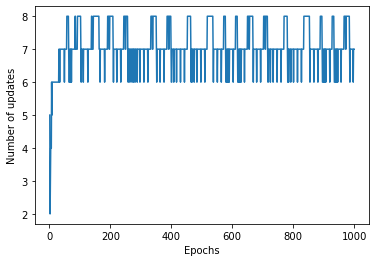

In [10]:
ppn = Perceptron(eta=0.01, n_iter=1000)

ppn.fit(X, y)

plt.plot(range(1, len(ppn.errors_) + 1), ppn.errors_)
plt.xlabel('Epochs')
plt.ylabel('Number of updates')

# plt.savefig('images/02_07.png', dpi=300)
plt.show()

# The tea and Coffee data are not completely linearly separable, and there is a lot of overlap in data.
# Thus, perfect classification is difficult.


### A function for plotting decision regions

In [2]:
from matplotlib.colors import ListedColormap


def plot_decision_regions(X, y, classifier, resolution=0.02):

    # setup marker generator and color map
    markers = ('o', 's', '^', 'v', '<')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))
    lab = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    lab = lab.reshape(xx1.shape)
    plt.contourf(xx1, xx2, lab, alpha=0.3, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    # plot class examples
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], 
                    y=X[y == cl, 1],
                    alpha=0.8, 
                    c=colors[idx],
                    marker=markers[idx], 
                    label=f'Class {cl}', 
                    edgecolor='black')

### Plotting the decision region for the trained coffee vs tea classifier

In [3]:
plot_decision_regions(X, y, classifier=ppn)
plt.xlabel('Calories per ml')
plt.ylabel('Caffeine (mg per ml)')
plt.legend(loc='upper left')


#plt.savefig('images/02_08.png', dpi=300)
plt.show()

NameError: name 'x1' is not defined